# Loyalty Visualization


In [1]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import community
import seaborn as sns
import pandas as pd
import h5py
import os
import colorsys
import random

In [3]:
# Specify the path to your HDF5 file
file_path_loyalty = 'outputfolder/lattice2d_data/run_1/loyalty_output_1.h5'
# Open the HDF5 file in read mode
with h5py.File(file_path_loyalty, 'r') as hf:
    # Get the keys and sort them numerically
    sorted_keys = sorted(hf.keys(), key=lambda x: int(x.split('_')[-1]))
    dataset_loyalty = [] 
    # Now you can access datasets within the file
    for key in sorted_keys:
        dataset = hf[key]
        data = dataset[:]
        dataset_loyalty.append(data)

In [4]:
def generate_consecutive_colors(num_colors):
    colors = []
    for i in range(num_colors):
        hue = i / num_colors  # Generate hue values from 0 to 1
        saturation = 0.9  # Adjust saturation and value to get different shades of colors
        value = 0.9
        rgb = colorsys.hsv_to_rgb(hue, saturation, value)
        colors.append(rgb)
    return colors

cluster_colors = generate_consecutive_colors(100)
random.shuffle(cluster_colors)

In [5]:
loyalty = np.stack(dataset_loyalty, axis=0)
loyalty = np.array(dataset_loyalty)

In [6]:
loyalty.shape

(1001, 100, 100)

## Commitment Grid Matrix Visualization

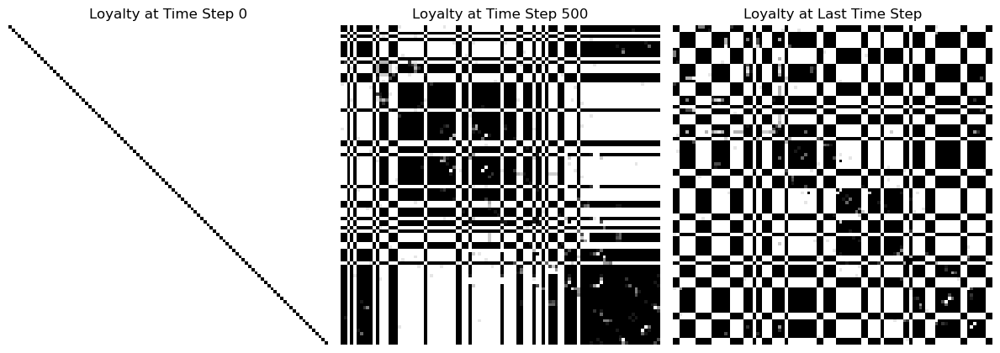

In [7]:
# Create a figure with subplots
fig, axs = plt.subplots(1, 3, figsize=(12, 10))

# Subplot for loyalty[0, :, :]
axs[0].imshow(loyalty[0], cmap='gray_r', interpolation='nearest')
axs[0].set_title('Loyalty at Time Step 0')
axs[0].axis('off')

# Subplot for loyalty[50, :, :]
axs[1].imshow(loyalty[500], cmap='gray_r', interpolation='nearest')
axs[1].set_title('Loyalty at Time Step 500')
axs[1].axis('off')

# Subplot for loyalty[-1, :, :]
axs[2].imshow(loyalty[-1], cmap='gray_r', interpolation='nearest')
axs[2].set_title('Loyalty at Last Time Step')
axs[2].axis('off')

# Add a colorbar for the heatmap in the last subplot
#cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [x, y, width, height]
#cbar = plt.colorbar(axs[2].imshow(loyalty[-1, :, :], cmap='viridis', interpolation='nearest'), cax=cbar_ax)
#cbar.set_label('Color Intensity')

plt.tight_layout()
plt.show()

## Commitment Graph Network

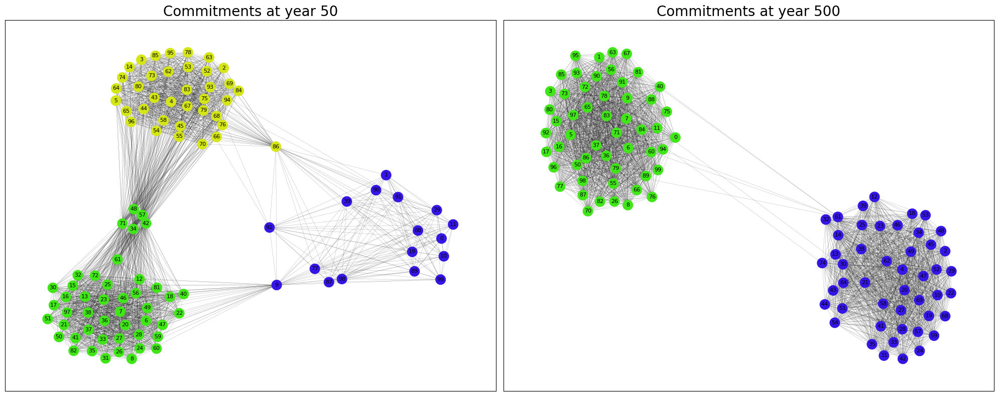

In [13]:

# First subplot: All edges
plt.figure(figsize=(20, 8))

test_mtx = loyalty[50, :, :]
G = nx.Graph()
G.add_nodes_from(range(len(test_mtx)))
for i in range(len(test_mtx)):
    for j in range(len(test_mtx)):
        if i != j and test_mtx[i, j] >= 5:  # Exclude self-edges
            G.add_edge(i, j, weight=test_mtx[i, j])

partition = community.best_partition(G)
node_colors = [cluster_colors[partition[node]] for node in G.nodes()]
pos = nx.spring_layout(G, k=1.9, seed=32)
node_sizes = 200
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes)
nx.draw_networkx_edges(G, pos, width=0.1)
nx.draw_networkx_labels(G, pos, font_weight='medium', font_size=8)
plt.title('Commitments at year 50', fontsize = 20)

# Second subplot: Edges with weight >= 5
test_mtx = loyalty[500, :, :]
G = nx.Graph()
G.add_nodes_from(range(len(test_mtx)))
for i in range(len(test_mtx)):
    for j in range(len(test_mtx)):
        if i != j and test_mtx[i, j] >= 5:
            G.add_edge(i, j, weight=test_mtx[i, j])

partition = community.best_partition(G)
node_colors = [cluster_colors[partition[node]] for node in G.nodes()]
pos = nx.spring_layout(G, k=1.9, seed=32)
node_sizes = 200
plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes)
nx.draw_networkx_edges(G, pos, width=0.1)
nx.draw_networkx_labels(G, pos, font_weight='medium', font_size=8)
plt.title('Commitments at year 500', fontsize = 20)

plt.tight_layout()
plt.show()


### Generating images

In [40]:
for i in range(60):
    test_mtx = loyalty[i,:,:]
    G = nx.Graph()
    # Add nodes to the graph
    G.add_nodes_from(range(len(test_mtx)))
    # Add edges to the graph based on the matrix
    for j in range(len(test_mtx)):
        for k in range(len(test_mtx)):
            if j != k and test_mtx[j, k] >= 5:  # Exclude self-edges
                G.add_edge(j, k, weight=test_mtx[j, k])

    # Detect clusters and color nodes accordingly
    partition = community.best_partition(G)
    node_colors = [cluster_colors[partition[node]] for node in G.nodes()]
    # Use spring_layout for better node positioning
    #pos = nx.fruchterman_reingold_layout(G,k=1.6, seed = 32)
    pos = nx.spring_layout(G, k=1.9, seed=32) 
    node_sizes = 500  # Change node size here

    # Plot the graph and save it as an image file
    plt.figure(figsize=(20, 15), facecolor='white')  # Adjust the figure size if desired
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes)
    nx.draw_networkx_edges(G, pos, width=0.1)
    nx.draw_networkx_labels(G, pos, font_weight='medium', font_size=10)

    plt.title(f'Commitments at Year: {i+1}', fontsize=25)
    plt.savefig(os.path.join('outputfolder', 'animations', f'loyalty_network_{str(i).zfill(3)}.png'))
    plt.close()

In [23]:
import glob
from PIL import Image

In [24]:
import os

In [41]:
image_path = 'outputfolder/animations/'

# Match the file names based on the pattern 'loyalty_network_*.png'
images_in = os.path.join(image_path, 'loyalty_network_*.png')

gif_image_out = os.path.join(image_path, 'test1.gif')
image_files = sorted(glob.glob(images_in), key=lambda x: int(x.split("_")[2].split(".")[0]))
imgs = (Image.open(f) for f in image_files)

img = next(imgs)

img.save(fp = gif_image_out, format='GIF', append_images=imgs, save_all=True, duration=200, loop=0)

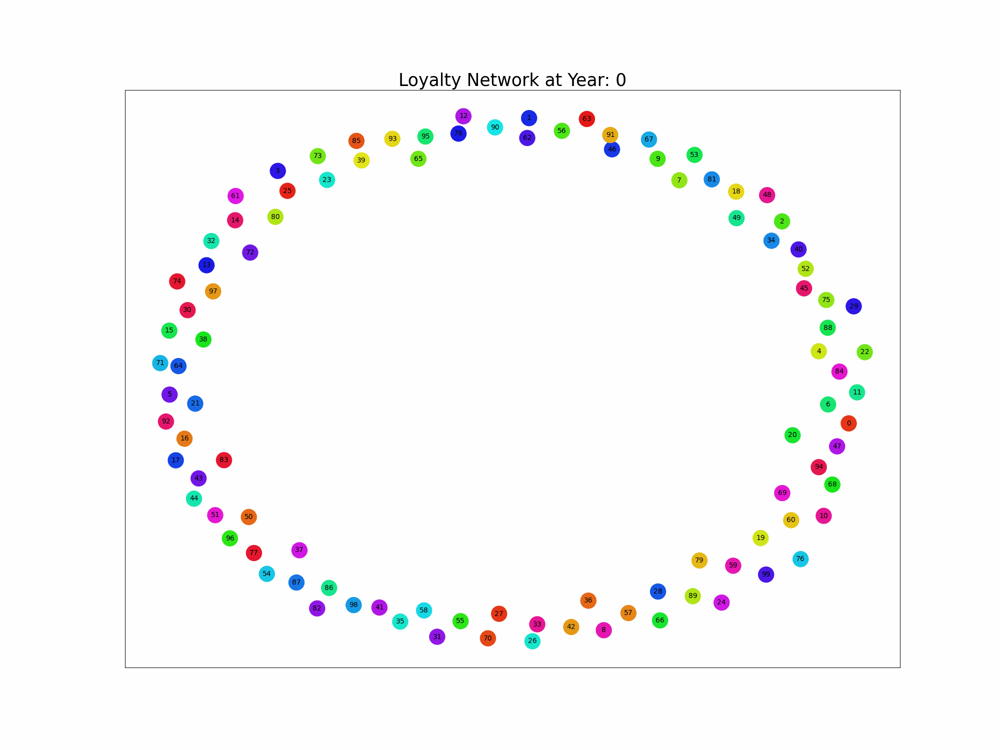

In [8]:
from IPython.display import display, Image

# Specify the path to your GIF file
gif_image_path = "network.gif"

# Display the GIF in the Jupyter Notebook
with open(gif_image_path, "rb") as f:
    display(Image(data=f.read(),width=800, height=800))
